<a href="https://colab.research.google.com/github/ranna-waleed/Image-Enhancement/blob/main/Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importing necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
import zipfile
import os
from google.colab.patches import cv2_imshow

**Setup and File Upload**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving media.zip to media.zip


In [ ]:
zip_path = 'media.zip'
extract_path = 'media'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

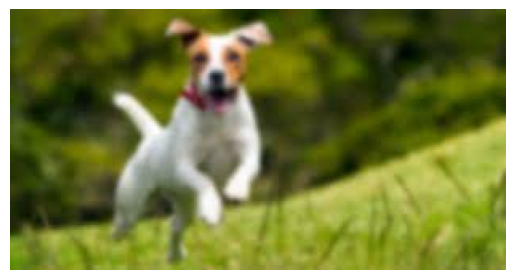

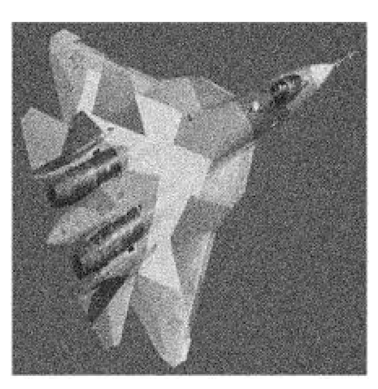

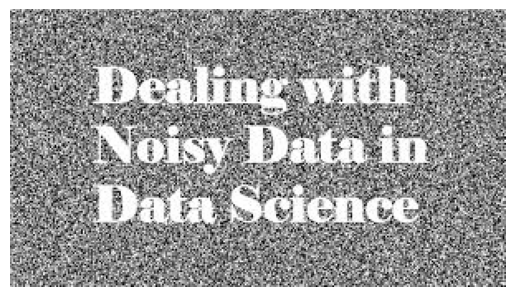

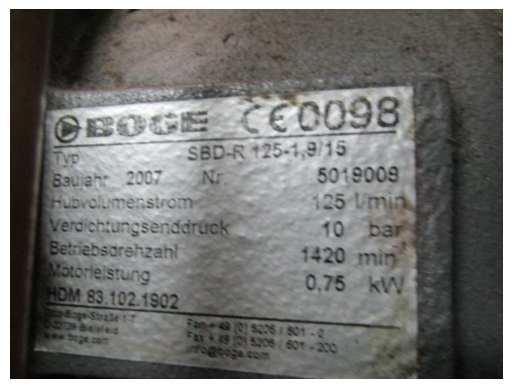

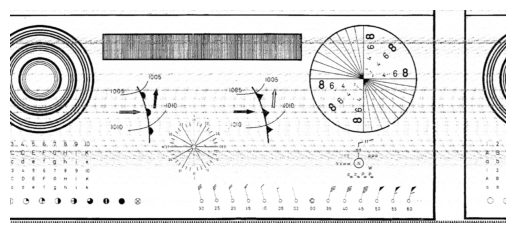

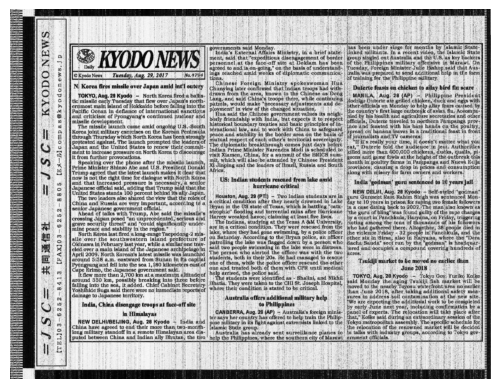

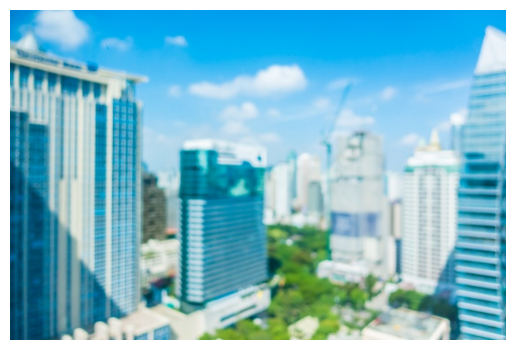

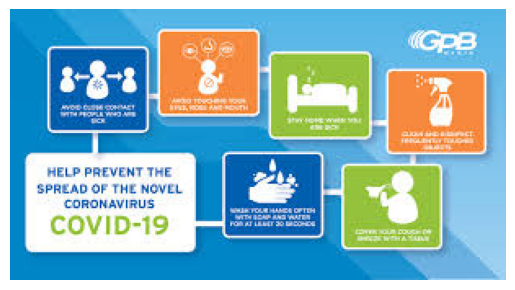

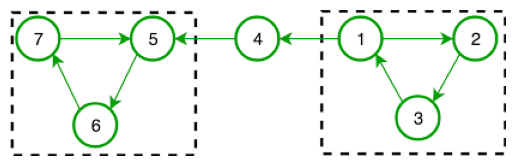

In [ ]:
def load_and_display_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

image_files = ['Dog.jpeg', 'Rocket.jpeg', 'Text.jpeg', 'Name plate.jpg', 'Noisy_1.png', 'Noisy_2.jpg', 'Building.jpg', 'Multi_objects_separation.jpeg', '7 circles.png']
for image_file in image_files:
    load_and_display_image(os.path.join(extract_path, image_file))

[1] Component Extraction from the following images

• Circle

• COVID‐19 Chart

 # Circle


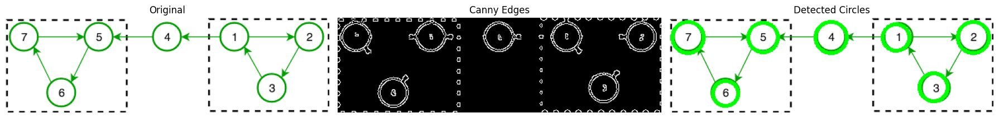

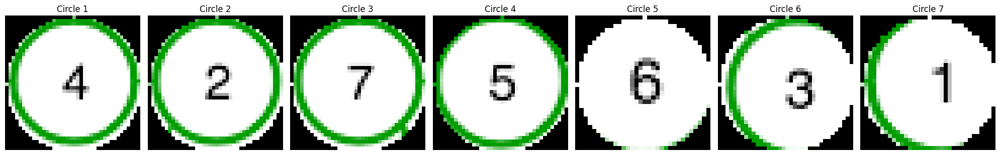

In [ ]:
#circle
# Load image
img = cv2.imread('media/7 circles.png', cv2.IMREAD_COLOR)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Step 1: Denoising (Median Filter)
denoised = cv2.medianBlur(gray, 5)

# Step 2: Edge Detection (Canny)
edges = cv2.Canny(denoised, 50, 150)

# Step 3: Hough Circle Transform
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30,
                           param1=50, param2=30, minRadius=15, maxRadius=30)

# Step 4: Draw detected circles and extract them
output = img.copy()

extracted_circles = []
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i, (x, y, r) in enumerate(circles[0, :]):
        cv2.circle(output, (x, y), r, (0, 255, 0), 4)

        # Extract circle region using a mask
        mask = np.zeros_like(gray)
        cv2.circle(mask, (x, y), r, 255, -1)
        masked = cv2.bitwise_and(img, img, mask=mask)
        cropped = masked[y - r:y + r, x - r:x + r]
        extracted_circles.append(cropped)

# Display results
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.title('Detected Circles')
plt.axis('off')

plt.tight_layout()
plt.show()

# Show extracted circles
if extracted_circles:
    plt.figure(figsize=(20, 4))
    for i, circle in enumerate(extracted_circles):
        plt.subplot(1, len(extracted_circles), i + 1)
        plt.imshow(cv2.cvtColor(circle, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle {i+1}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No circles extracted.")

# Covid 19 chart

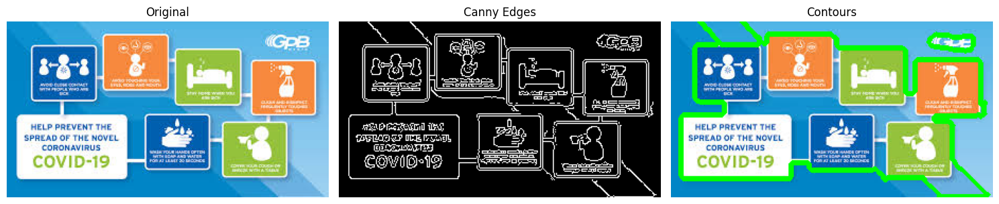

In [ ]:
def process_covid_chart_canny(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Step 1: Canny Edge Detection
    edges = cv2.Canny(gray, threshold1=50, threshold2=150)

    # Step 2: Morphological Closing to connect broken parts
    kernel = np.ones((3, 3), np.uint8)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)

    # Step 3: Contour Detection
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    result = img.copy()
    cv2.drawContours(result, contours, -1, (0, 255, 0), 4)

    # Step 4: Display results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title("Canny Edges")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title("Contours")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

process_covid_chart_canny(os.path.join('media', 'Multi_objects_separation.jpeg'))

Displaying Thresholded Image:


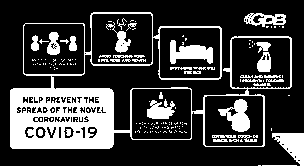

Displaying Image After Contour Filtering:


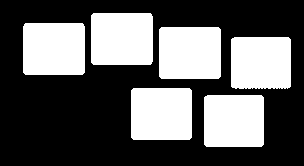

Displaying Morphologically Processed Image (after cleanup):


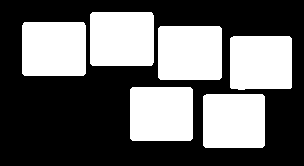

Displaying Contours Drawn Image:


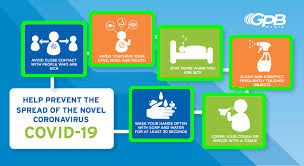

In [ ]:
image_path = "media/Multi_objects_separation.jpeg"
image = cv2.imread(image_path)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 1: Apply thresholding
_, thresh = cv2.threshold(gray, 190, 255, cv2.THRESH_BINARY)

# Save and display thresholded image
cv2.imwrite("thresholded.jpeg", thresh)
print("Displaying Thresholded Image:")
cv2_imshow(thresh)

# Step 2: Remove edges (arrows) using contour filtering and morphological cleanup
contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the filtered contours (boxes only)
morph = np.zeros_like(thresh)

# Filter contours: keep large, box-like contours, discard small or narrow ones (arrows)
for contour in contours:
    area = cv2.contourArea(contour)
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = float(w) / h if h != 0 else 1.0
    # Increase area threshold and add aspect ratio to exclude narrow arrows
    if area > 1000 and 0.5 <= aspect_ratio <= 2.0:  # Boxes are roughly square/rectangular
        cv2.drawContours(morph, [contour], -1, 255, -1)

# Save and display the image after contour filtering
cv2.imwrite("filtered.jpeg", morph)
print("Displaying Image After Contour Filtering:")
cv2_imshow(morph)

# Step 2.5: Morphological opening to remove residual arrow fragments
kernel = np.ones((3, 3), np.uint8)
morph = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel, iterations=2)

# Light dilation to restore box shapes
morph = cv2.dilate(morph, np.ones((3, 3), np.uint8), iterations=1)

# Save and display the final morphologically processed image
cv2.imwrite("morph_processed.jpeg", morph)
print("Displaying Morphologically Processed Image (after cleanup):")
cv2_imshow(morph)

# Step 3: Find contours of the remaining boxes
contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a directory to save extracted components
output_dir = "extracted_boxes"
os.makedirs(output_dir, exist_ok=True)

# Step 4: Extract and save each box
for i, contour in enumerate(contours):
    # Get the bounding rectangle for each contour
    x, y, w, h = cv2.boundingRect(contour)

    # Extract the region of interest (ROI) from the original image
    roi = image[y:y+h, x:x+w]

    # Save the extracted box
    cv2.imwrite(os.path.join(output_dir, f"box_{i}.jpeg"), roi)

# Draw contours on the original image for visualization
output_image = image.copy()
cv2.drawContours(output_image, contours, -1, (0, 255, 0), 2)

# Save and display the final image with contours
cv2.imwrite("contours_drawn.jpeg", output_image)
print("Displaying Contours Drawn Image:")
cv2_imshow(output_image)

[2] Enhancement of Blurry Images

• Buildings

• Dog


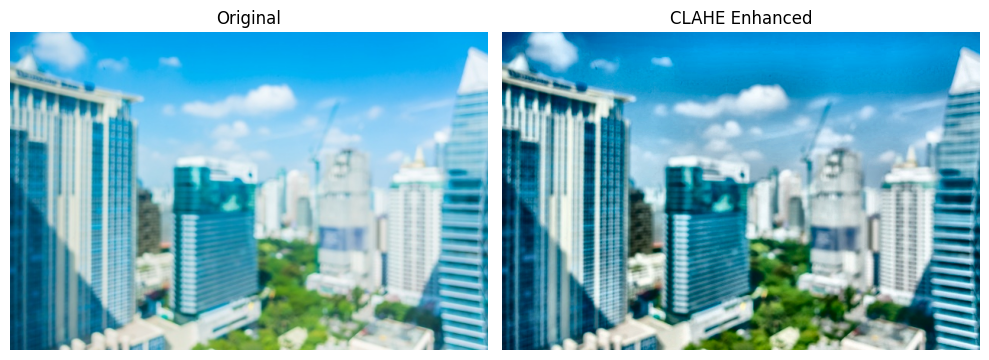

In [ ]:
# Buildings
def apply_clahe_color(image_path):
    img = cv2.imread(image_path)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    # Split LAB channels
    l, a, b = cv2.split(lab)

    # Apply CLAHE to the L (lightness) channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)

    # Merge and convert back to BGR
    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced_img = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    # Show original and enhanced
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.title("Original"); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB)); plt.title("CLAHE Enhanced"); plt.axis('off')
    plt.tight_layout()
    plt.show()

apply_clahe_color("media/Building.jpg")

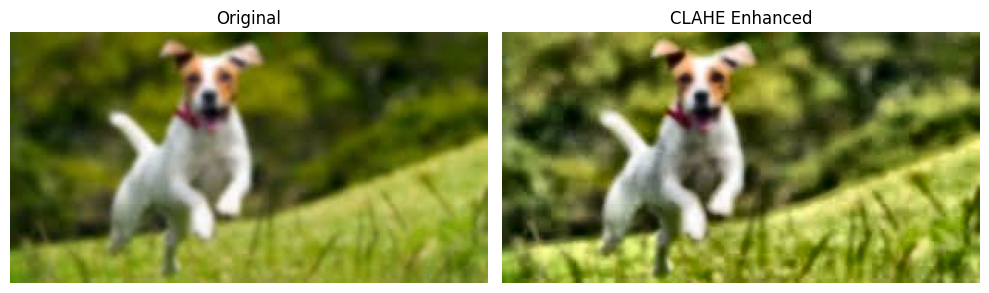

In [ ]:
# Dog
def apply_clahe_color(image_path):
    img = cv2.imread(image_path)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    # Split LAB channels
    l, a, b = cv2.split(lab)

    # Apply CLAHE to the L (lightness) channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)

    # Merge and convert back to BGR
    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced_img = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    # Show original and enhanced
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.title("Original"); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB)); plt.title("CLAHE Enhanced"); plt.axis('off')
    plt.tight_layout()
    plt.show()

apply_clahe_color("media/Dog.jpeg")

[3] Noise removal from Noisy Images

• Text

• Rocket

• Wind Chart


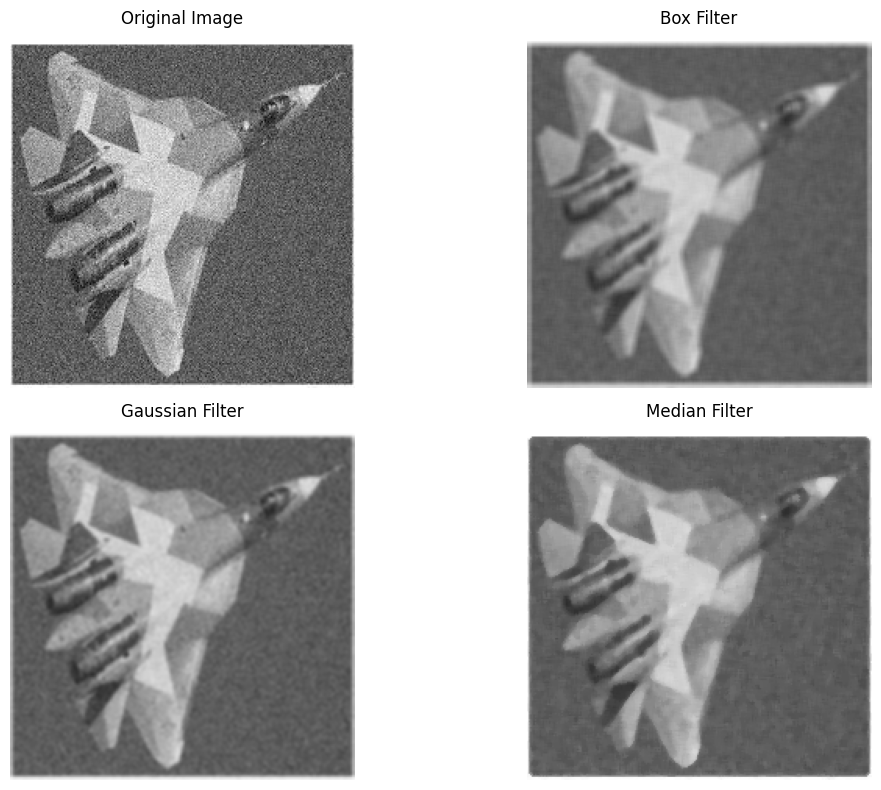

In [ ]:
#Rocket
def denoise_image_lab_style(image_path):
    original_image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Apply classical denoising filters (used in lab2)
    box_filtered = cv2.blur(original_image, (5, 5))             # Box filter
    gaussian_filtered = cv2.GaussianBlur(original_image, (5, 5), 0)  # Gaussian filter
    median_filtered = cv2.medianBlur(original_image, 5)         # Median filter

    # Convert all to RGB for matplotlib display
    box_rgb = cv2.cvtColor(box_filtered, cv2.COLOR_BGR2RGB)
    gaussian_rgb = cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB)
    median_rgb = cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB)

    # Plot the results
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(box_rgb)
    plt.title('Box Filter')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(gaussian_rgb)
    plt.title('Gaussian Filter')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(median_rgb)
    plt.title('Median Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

denoise_image_lab_style(os.path.join(extract_path, 'Rocket.jpeg'))

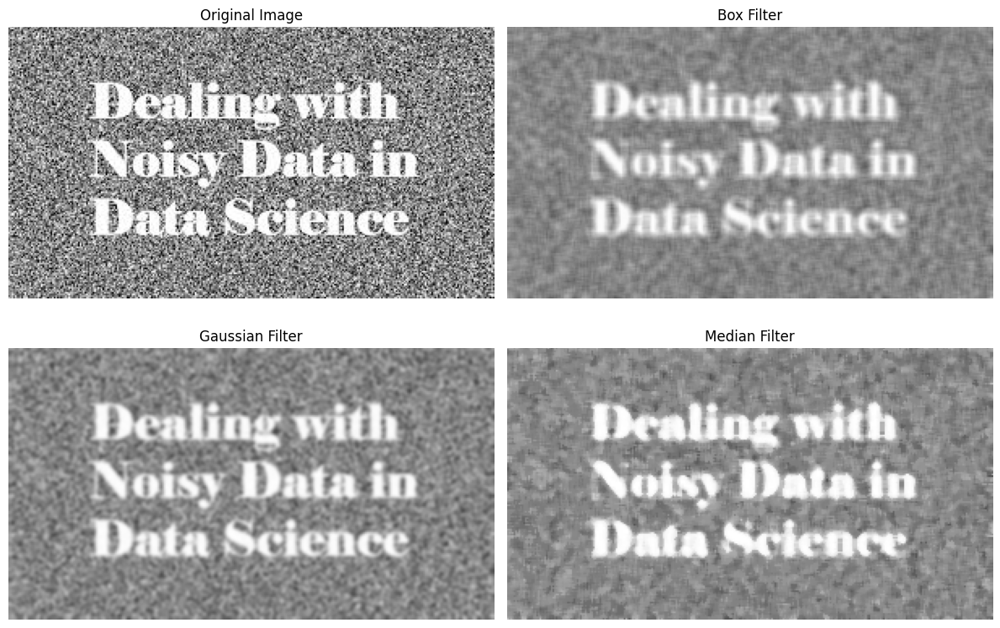

In [ ]:
#text
def denoise_image_lab_style(image_path):
    original_image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Apply classical denoising filters (used in lab2)
    box_filtered = cv2.blur(original_image, (5, 5))             # Box filter
    gaussian_filtered = cv2.GaussianBlur(original_image, (5, 5), 0)  # Gaussian filter
    median_filtered = cv2.medianBlur(original_image, 5)         # Median filter

    # Convert all to RGB for matplotlib display
    box_rgb = cv2.cvtColor(box_filtered, cv2.COLOR_BGR2RGB)
    gaussian_rgb = cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB)
    median_rgb = cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB)

    # Plot the results
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(box_rgb)
    plt.title('Box Filter')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(gaussian_rgb)
    plt.title('Gaussian Filter')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(median_rgb)
    plt.title('Median Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

denoise_image_lab_style(os.path.join(extract_path, 'Text.jpeg'))

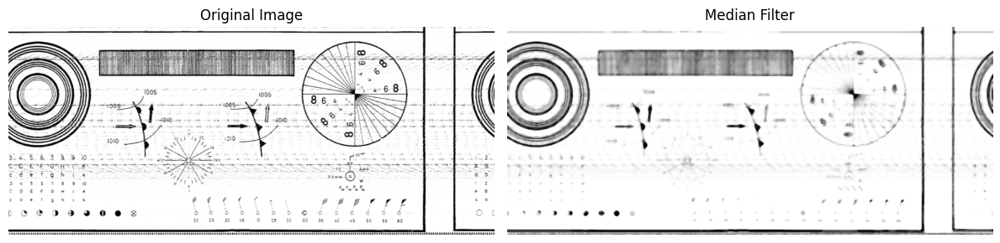

In [ ]:
#Wind chart
def denoise_image_lab_style(image_path):
    original_image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Apply classical denoising filters (used in lab2)
    median_filtered = cv2.medianBlur(original_image, 7)  # Median filter

    # Convert all to RGB for matplotlib display
    median_rgb = cv2.cvtColor(median_filtered, cv2.COLOR_BGR2RGB)

    # Plot the results
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(median_rgb)
    plt.title('Median Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

denoise_image_lab_style(os.path.join(extract_path, 'Noisy_1.png'))

[4] Visual enhancement of the following images (Challenging Images)

• Newspaper

• Name Plate

#newspaper

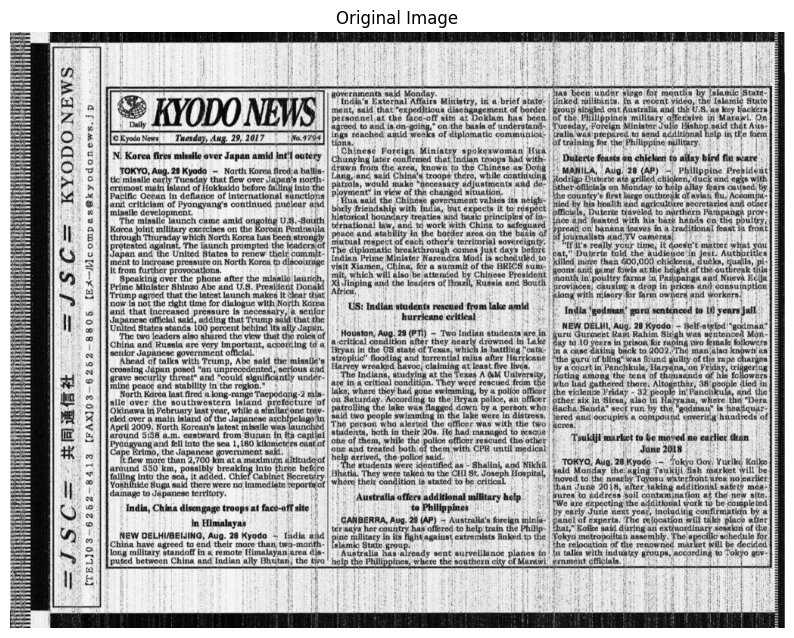

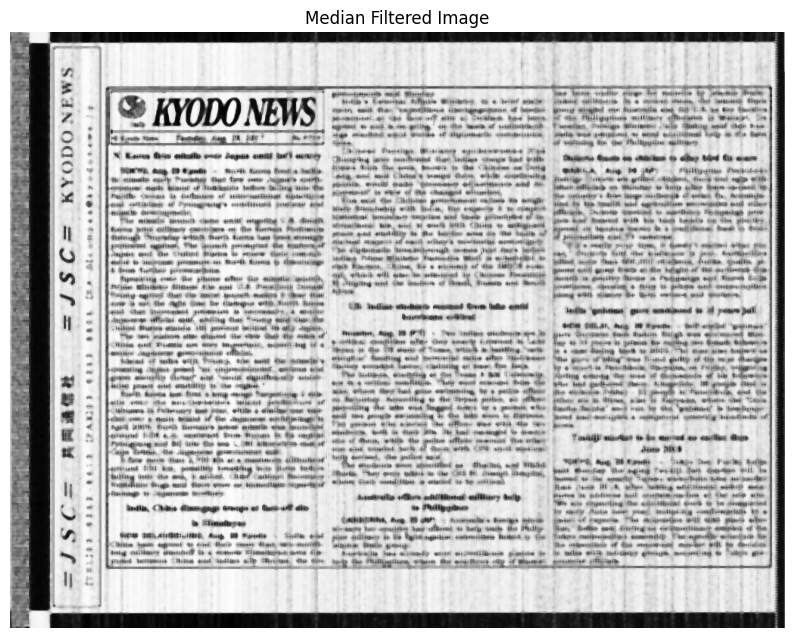

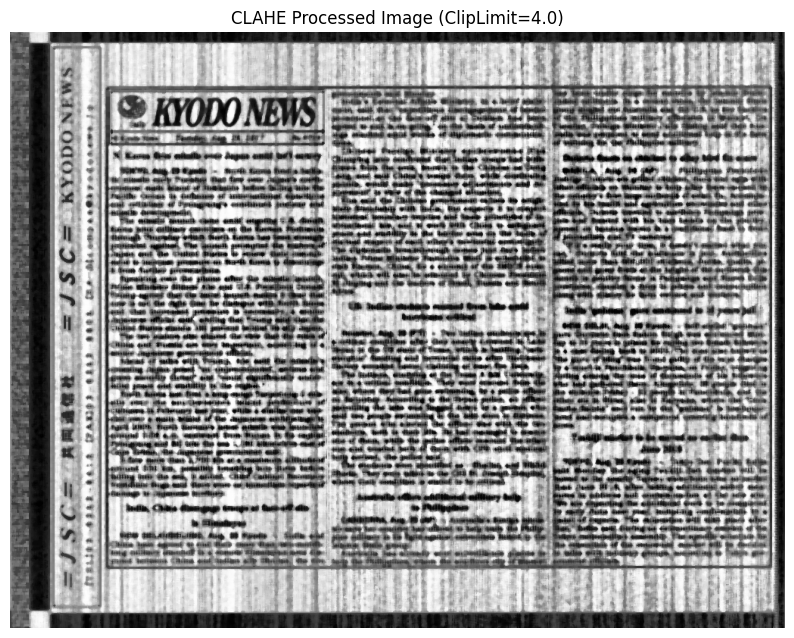

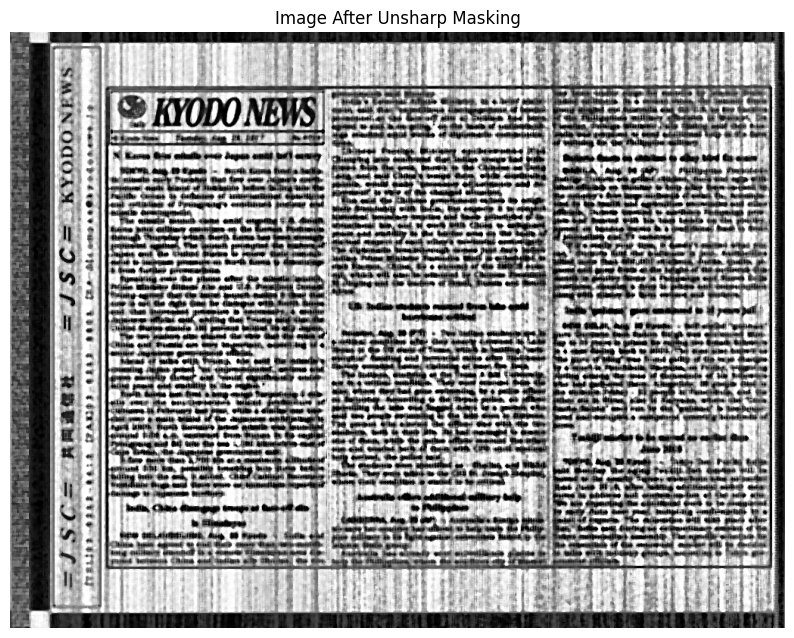

In [ ]:
#newspaper
image = cv2.imread('media/Noisy_2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 1: Median Filter to remove noise
image_median = cv2.medianBlur(image_gray, 5)

# Step 2: Apply stronger CLAHE for better contrast
clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
image_clahe = clahe.apply(image_median)

# Step 3: Apply Unsharp Masking to bring out text edges
gaussian_blur = cv2.GaussianBlur(image_clahe, (9, 9), 10.0)
image_sharp = cv2.addWeighted(image_clahe, 1.5, gaussian_blur, -0.5, 0)

# Step 1: Display Original Image
plt.figure(figsize=(10, 10))
plt.imshow(image_gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.savefig('original_image.jpg')
plt.show()

# Step 2: Display Median Filtered Image
plt.figure(figsize=(10, 10))
plt.imshow(image_median, cmap='gray')
plt.title('Median Filtered Image')
plt.axis('off')
plt.savefig('median_filtered_image.jpg')
plt.show()

# Step 3: Display CLAHE Processed Image
plt.figure(figsize=(10, 10))
plt.imshow(image_clahe, cmap='gray')
plt.title('CLAHE Processed Image (ClipLimit=4.0)')
plt.axis('off')
plt.savefig('clahe_processed_image.jpg')
plt.show()

# Step 4: Display Unsharp Masked Image
plt.figure(figsize=(10, 10))
plt.imshow(image_sharp, cmap='gray')
plt.title('Image After Unsharp Masking')
plt.axis('off')
plt.savefig('unsharp_masked_image.jpg')
plt.show()

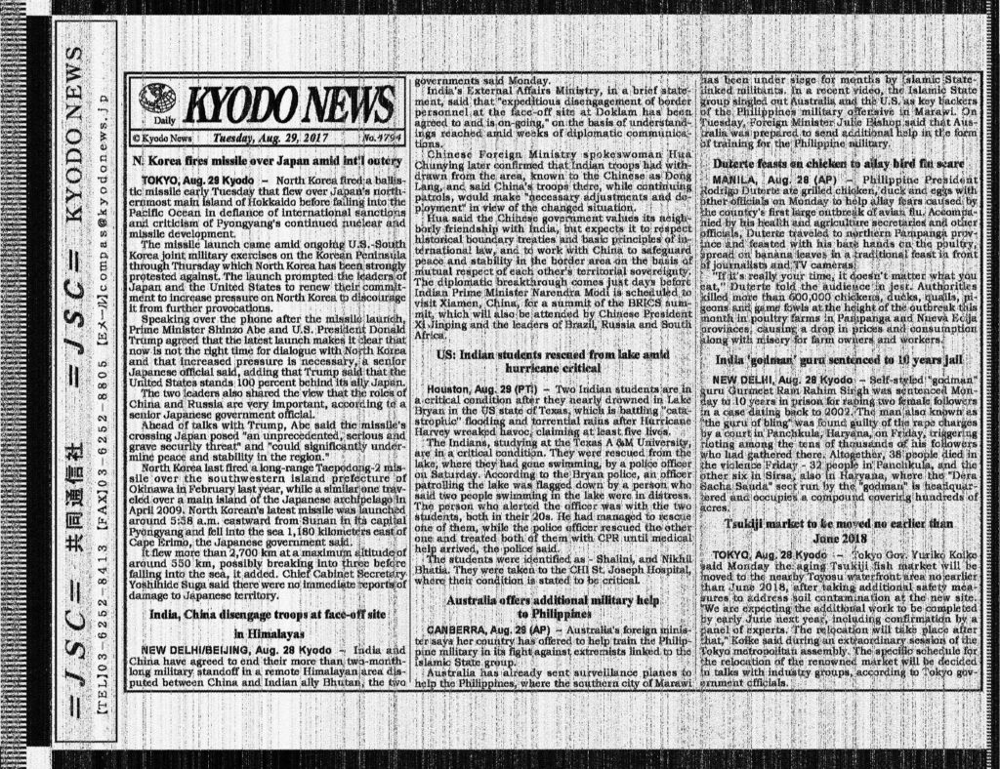

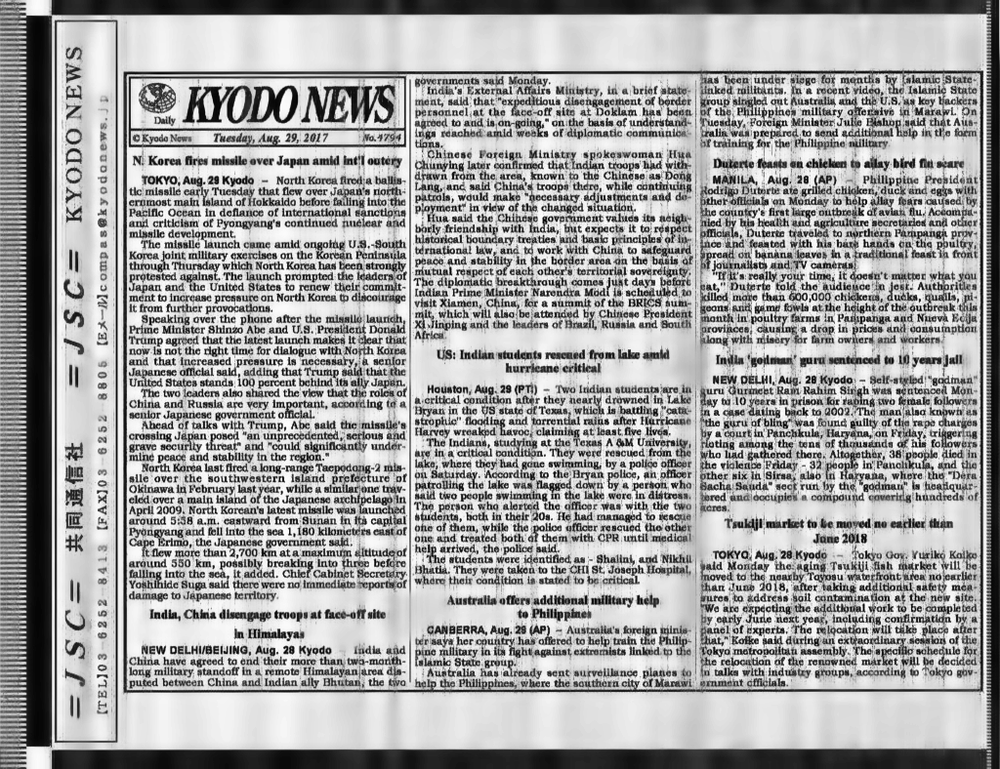

True

In [ ]:
#newspaper
image = cv2.imread('media/Noisy_2.jpg')
# Convert to YUV and process luminance
yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(yuv)

# Denoise and enhance Y channel
# h: filter strength,
# templateWindowSiz: patch size,
# searchWindowSize: area to search similar patches
y = cv2.fastNlMeansDenoising(y, h=25, templateWindowSize=21, searchWindowSize=25)

# d: diameter of pixel neighborhood,
# sigmaColor and sigmaSpace control the filter strength
y = cv2.bilateralFilter(y, d=15, sigmaColor=30, sigmaSpace=20)


# clipLimit: threshold for contrast clipping,
# tileGridSize: grid size for adaptive histogram equalization
y = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16,16)).apply(y)

# Merge and convert back to BGR
enhanced_image = cv2.cvtColor(cv2.merge([y, u, v]), cv2.COLOR_YUV2BGR)

# Display and save
cv2_imshow(image)
cv2_imshow(enhanced_image)
cv2.imwrite('final_enhanced_image.jpg', enhanced_image)

#Name plate

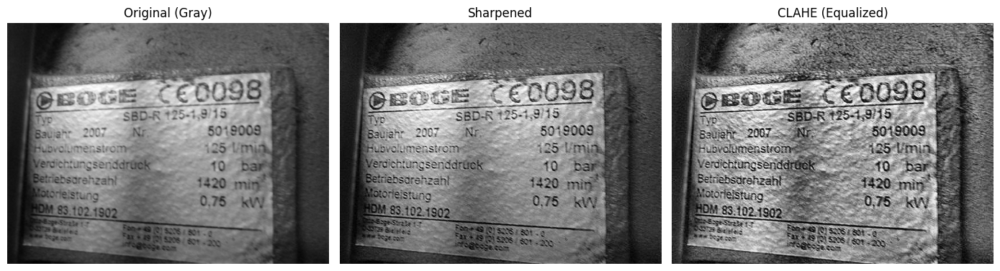

In [ ]:
#name plate
def enhance_name_plate(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]], dtype=np.float32)
    sharpened = cv2.filter2D(gray, -1, kernel)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized = clahe.apply(sharpened)

    titles = ["Original (Gray)", "Sharpened", "CLAHE (Equalized)"]
    images = [gray, sharpened, equalized]
    plt.figure(figsize=(14, 8))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    cv2.imwrite('processed_nameplate.jpg', equalized)

enhance_name_plate("media/Name plate.jpg")